# Playing around with Photoshop's curves.. without Photoshop
I'm learning about images and curves layers using Python.

This notebook shows Alex Burke's method for inverting scans of color negatives (https://www.alexburkephoto.com/blog/2019/10/16/manual-inversion-of-color-negative-film) - something I found very interesting.

Requirements:
```
numpy==1.18.3
scipy==1.4.1
matplotlib==3.2.1
opencv-python==4.5.1.48
Pillow==8.1.0
```

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate

In [2]:
def imshow(image, title=None):
    if len(image.shape) > 3:
        image = np.squeeze(image, axis=0)
    if len(image.shape) < 3:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)
    if title:
        plt.title(title)

In [3]:
img = cv2.imread('neg_scan.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.astype(np.float32) / 255.0

In [4]:
img.shape

(800, 636, 3)

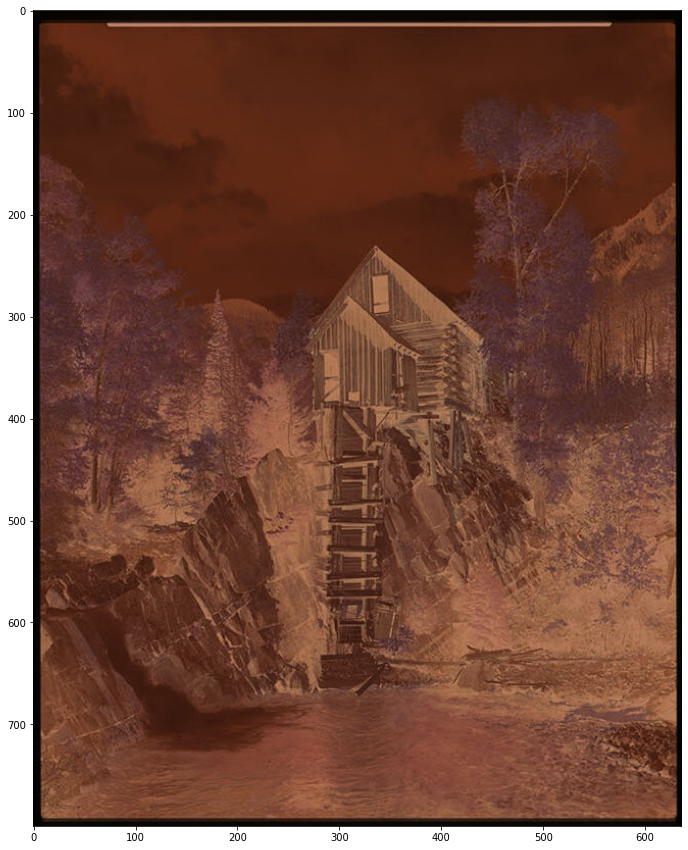

In [5]:
plt.figure(figsize=(15,15))
imshow(img)

In [6]:
img.dtype

dtype('float32')

# Basic invert:

In [7]:
# img_inv = np.array([255], dtype=np.uint8) - img
img_inv = 1 - img

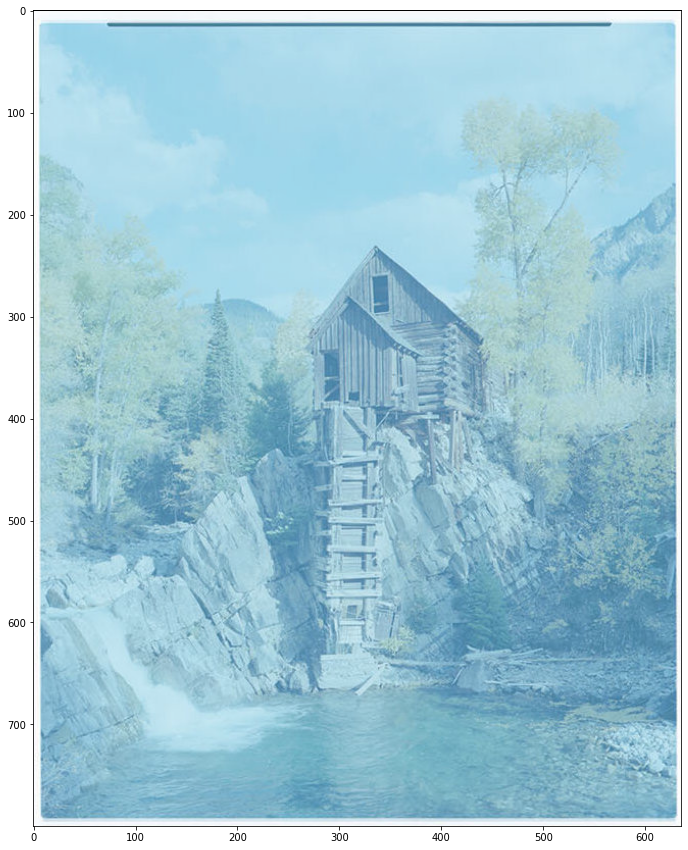

In [8]:
plt.figure(figsize=(15,15))
imshow(img_inv)

# Subtract film's base (get its color from that small area):

array([ 74, 129, 154], dtype=uint8)

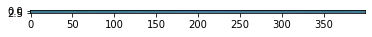

In [9]:
# That's the film border:
# plt.figure(figsize=(15,15))
imshow(img_inv[13:16, 100:500])
np.round(np.mean(img_inv[13:16, 100:500], axis=(0,1)) * 255).astype(np.uint8)

In [10]:
def hex2rgb(h):
    h = h.lstrip('#')
    return tuple(int(h[i:i+2], 16) for i in (0, 2, 4))

In [11]:
fill = np.zeros_like(img) + np.mean(img_inv[13:16, 100:500], axis=(0,1)).reshape(1, 1, -1)
opacity_coef = 0.8
img_inv_no_base = np.clip(img_inv - fill * opacity_coef, 0, 1)

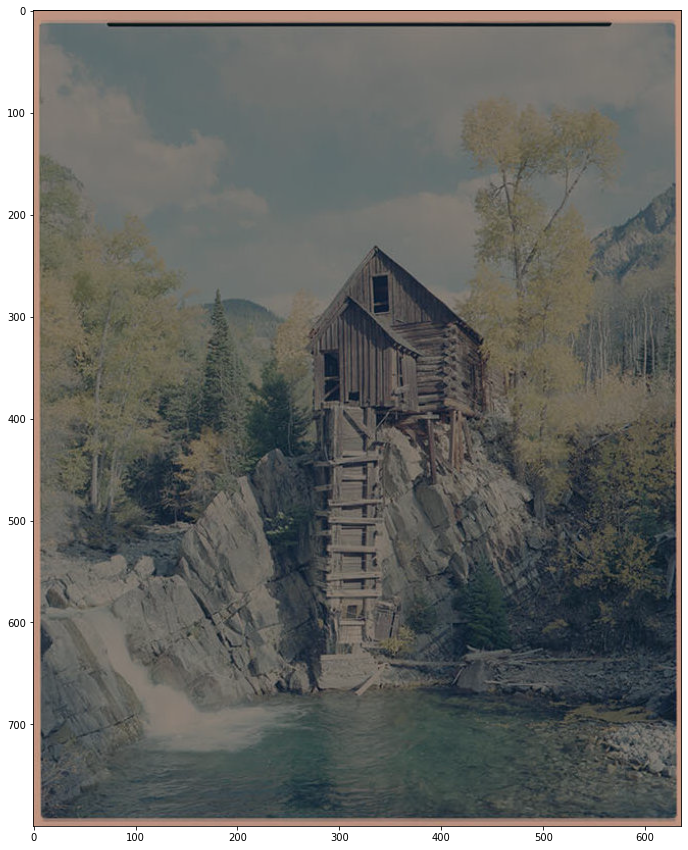

In [12]:
plt.figure(figsize=(15,15))
imshow(img_inv_no_base)

In [13]:
def set_endpoint(img, *fromtos, **kwargs):
    """fromtos = x, y, x, y, ... (xs will be set to ys)
    """
    assert len(fromtos) % 2 == 0
    fromtos = [x / 255 for x in fromtos]
    points_x = np.array([0.] + fromtos[::2] + [1.])
    points_y = np.array([0.] + fromtos[1::2] + [1.])
    inter = interpolate.interp1d(points_x, points_y)

    if kwargs.get('show_curve', False):
        x = np.arange(256)
        y = np.clip(inter(x / 255) * 255, 0, 255)
        plt.plot(x, y, x, x, 'r',
                 points_x * 255, points_y * 255, 'bo')
        plt.tight_layout()
        return

    channel = kwargs.get('channel')
    if channel is not None:
        img_new = img.copy()
        img_new[:, :, channel] = np.clip(inter(img[:, :, channel]), 0, 1)
    else:
        img_new = np.clip(inter(img), 0, 1)

    show_clipping = kwargs.get('show_clipping')
    if show_clipping is None:
        return img_new
    else:
        img_clips = np.zeros_like(img)
        if show_clipping == 'highlights':
            img_clips[img_new == 1.] = 1.
        elif show_clipping == 'shadows':
            img_clips[img_new == 0.] = 1.
        imshow(img_clips)

# Uncomment and play around with values to see clipping:

In [14]:
# plt.figure(figsize=(10,10))
# set_endpoint(img_inv_no_base, 145, 255, channel=0, show_clipping='highlights') # 120
# set_endpoint(img_inv_no_base, 135, 255, channel=1, show_clipping='highlights')  # 90
# set_endpoint(img_inv_no_base, 130, 255, channel=2, show_clipping='highlights')  # 80

# Set white point:

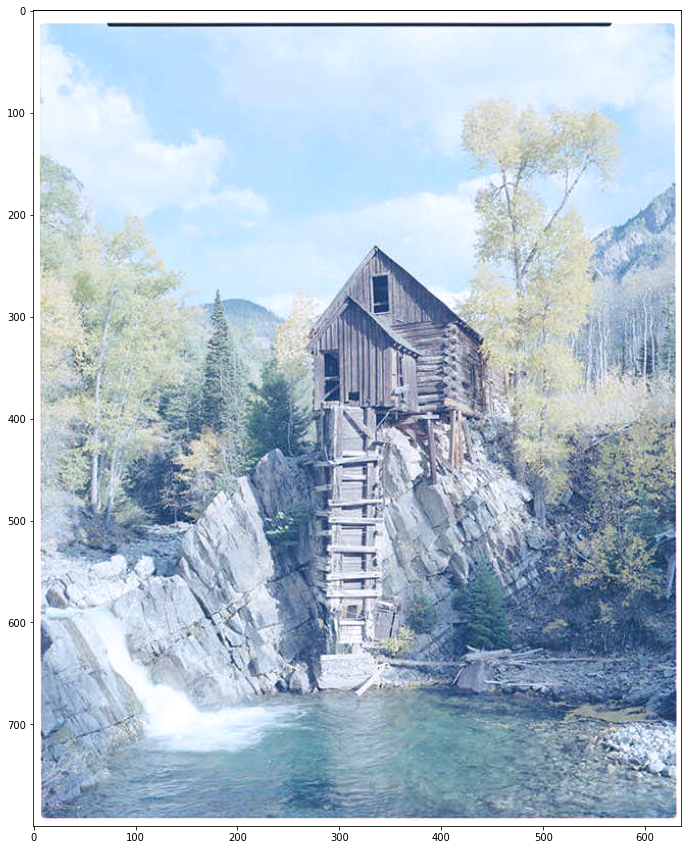

In [15]:
plt.figure(figsize=(15,15))
wp = np.array([135, 125, 109]) / 255
img_inv_no_base_wp = np.clip(img_inv_no_base / wp, 0, 1)
imshow(img_inv_no_base_wp)

# Curves layer:
Darken the mids

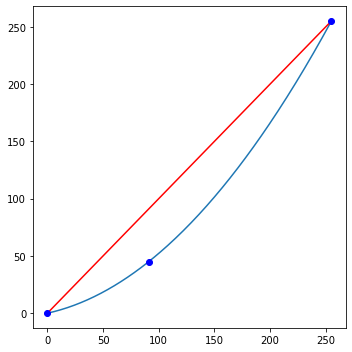

In [16]:
points_x = np.array([0, 91, 255]) / 255
points_y = np.array([0, 45, 255]) / 255
cs = interpolate.CubicSpline(points_x, points_y)

plt.figure(figsize=(5,5))
x = np.arange(256)
y = np.clip(cs(x / 255) * 255, 0, 255)
plt.plot(x, y,
         x, x, 'r',
         points_x * 255, points_y * 255, 'bo')
plt.tight_layout()

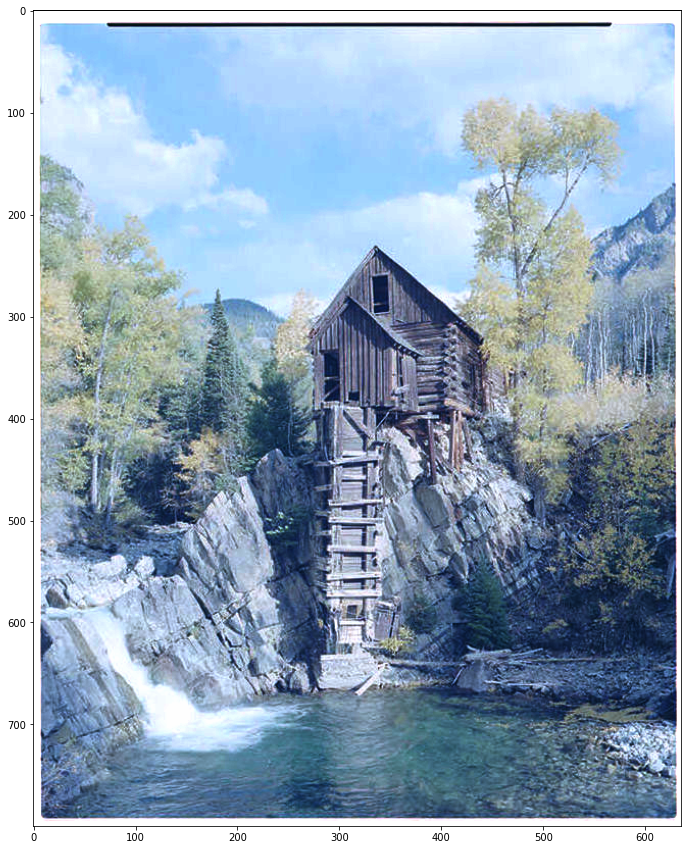

In [17]:
img_inv_no_base_wp_darken = np.clip(cs(img_inv_no_base_wp), 0, 1)

plt.figure(figsize=(15,15))
imshow(img_inv_no_base_wp_darken)

# Too blue, too green:

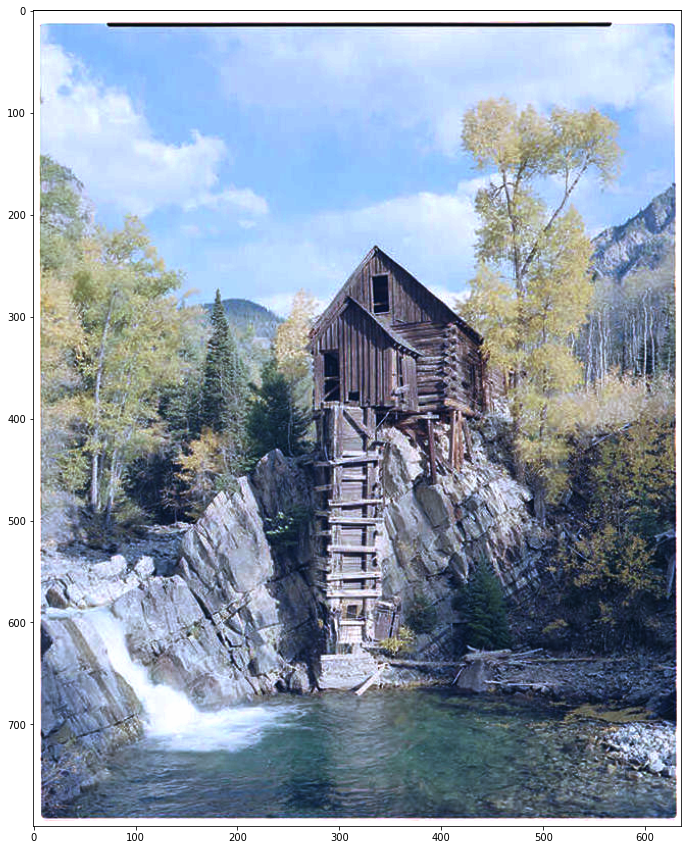

In [18]:
cs_blue = interpolate.CubicSpline([0., 128/255, 1.], [0., 105/255, 1.])

cs_green = interpolate.CubicSpline([0., 128/255, 1.], [0., 115/255, 1.])

img_inv_no_base_wp_darken_fix = np.dstack((
    img_inv_no_base_wp_darken[:, :, 0],
    np.clip(cs_green(img_inv_no_base_wp_darken[:, :, 1]), 0, 1),
    np.clip(cs_blue(img_inv_no_base_wp_darken[:, :, 2]), 0, 1)
))

plt.figure(figsize=(15,15))
imshow(img_inv_no_base_wp_darken_fix)

# Lift shadows?

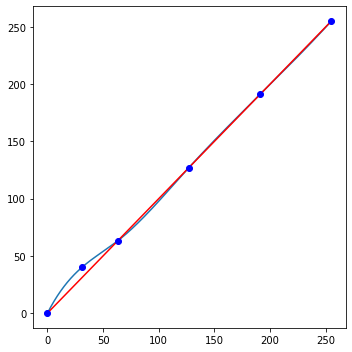

In [19]:
points_x = np.array([  0, 31,  63, 127, 191, 255]) / 255
points_y = np.array([  0, 40,  63, 127, 191, 255]) / 255
cs = interpolate.CubicSpline(points_x, points_y)

x = np.arange(256)
y = np.clip(cs(x / 255) * 255, 0, 255)
plt.figure(figsize=(5,5))
plt.plot(x, y, x, x, 'r',
         points_x * 255, points_y * 255, 'bo')
plt.tight_layout()

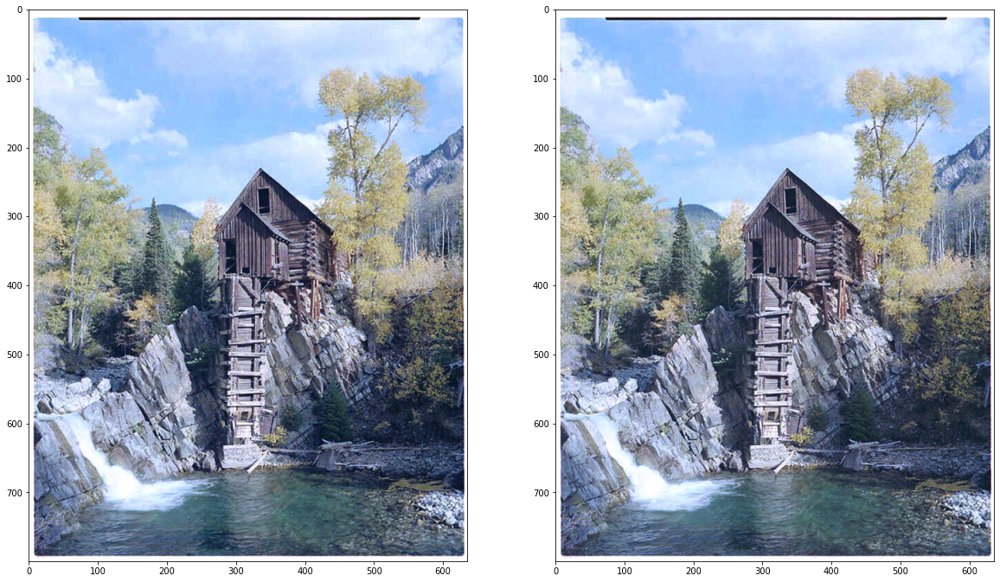

In [20]:
plt.figure(figsize=(20,20))
plt.subplot(121)
imshow(img_inv_no_base_wp_darken_fix)
plt.subplot(122)
imshow(np.clip(cs(img_inv_no_base_wp_darken_fix), 0, 1))

## Maybe not.

# Shift cyan -> blue:

In [21]:
img_hsv = cv2.cvtColor(img_inv_no_base_wp_darken_fix.astype(np.float32), cv2.COLOR_RGB2HSV)

In [22]:
img_hsv[:, :, 0].max()

359.8987

In [23]:
def hex2hue(hex_):
    return cv2.cvtColor((np.array(hex2rgb(hex_), dtype=np.float32) / 255.).reshape(1, 1, -1),
                        cv2.COLOR_RGB2HSV).item(0)

In [24]:
hex2hue('#00ffff')

180.0

## Show hue

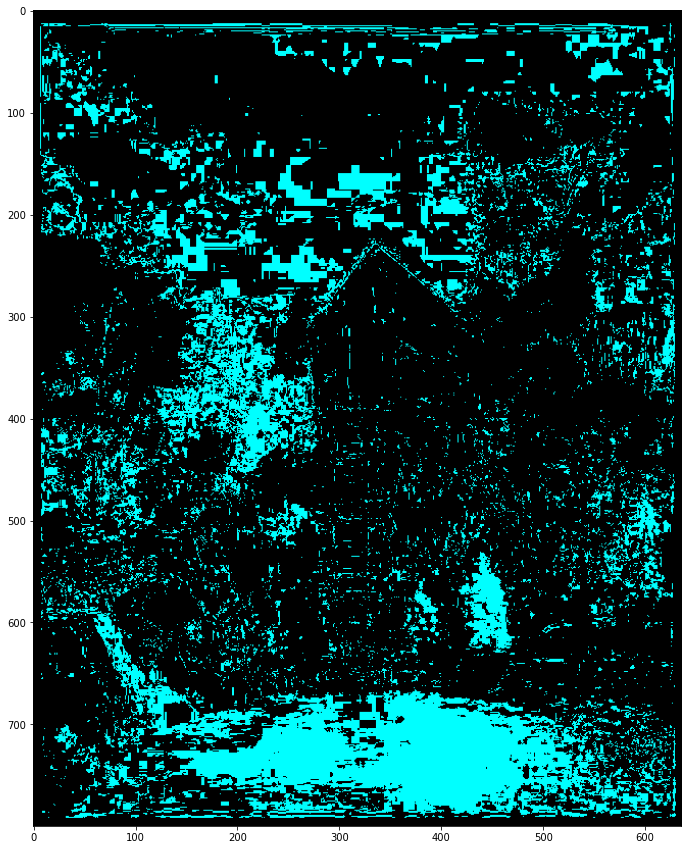

In [25]:
color = '#00ffff'
hue = hex2hue(color)
mask = np.zeros(360, dtype=np.bool)
mask[180-30:180+30] = True
mask = np.roll(mask, int(hue)-180)

show_hue = np.zeros_like(img, dtype=np.uint8)
show_hue[mask[img_hsv[:, :, 0].astype(int)]] = np.array(hex2rgb(color), dtype=np.uint8)
plt.figure(figsize=(15,15))
imshow(show_hue)

In [26]:
delta = 20.
shifter = np.zeros(360)
shifter[180-45:180-15] = np.linspace(0, delta, num=30, endpoint=False)
shifter[180-15:180+15] = np.full(30, delta)
shifter[180+15:180+45] = np.linspace(delta, 0, num=30)
shifter = np.roll(shifter, int(hue)-180)

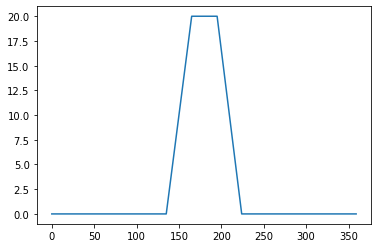

In [27]:
plt.plot(shifter)

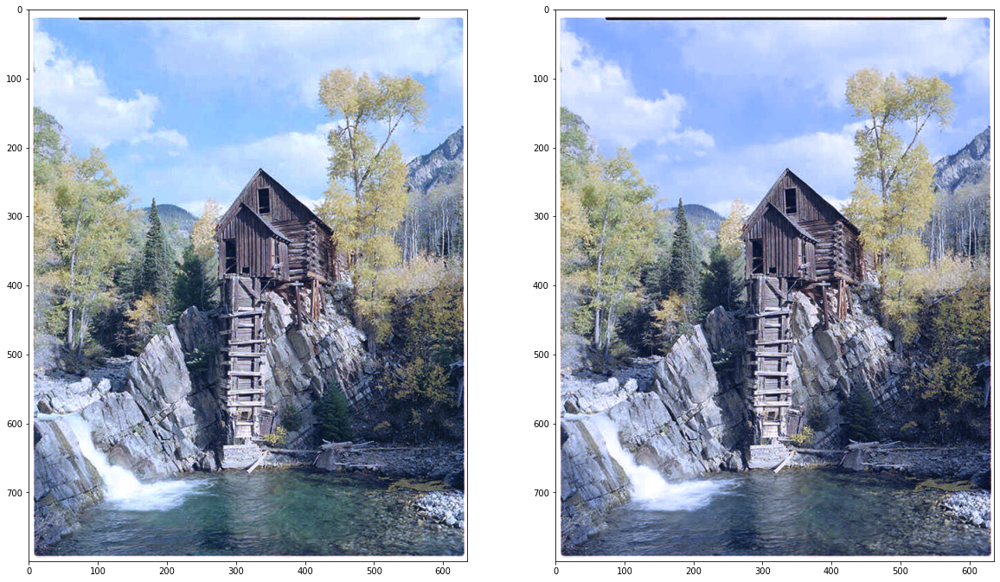

In [28]:
img_hsv_shift = np.dstack((
    ((img_hsv[:, :, 0] + shifter[np.round(img_hsv[:, :, 0]).astype(np.uint8)]) % 360).astype(np.float32),
    img_hsv[:, :, 1],
    img_hsv[:, :, 2]
))

img_shift = cv2.cvtColor(img_hsv_shift, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(20,20))
plt.subplot(121)
imshow(img_inv_no_base_wp_darken_fix)
plt.subplot(122)
imshow(img_shift)